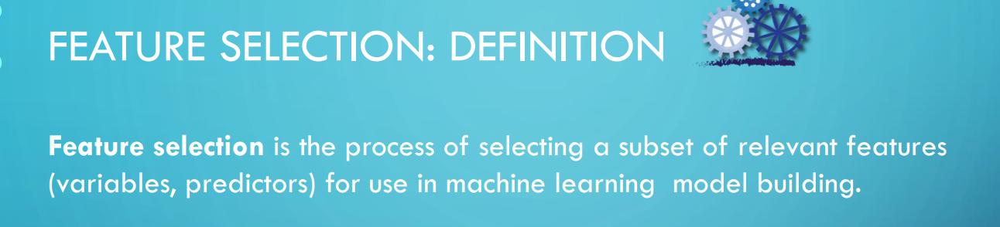


***Methods In Feature Selection:***

1. Filter Methods
2. Wrapper Methods
3. Embedded Methods

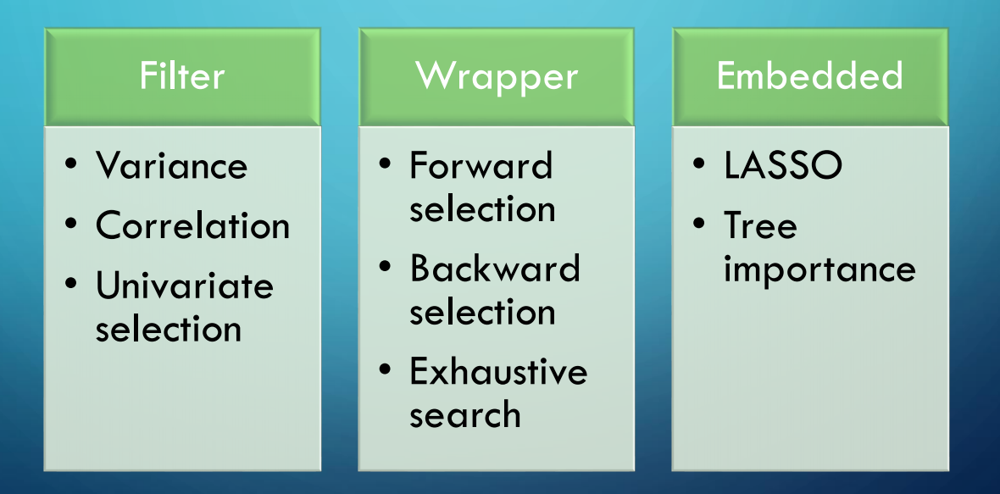

# Filter Methods

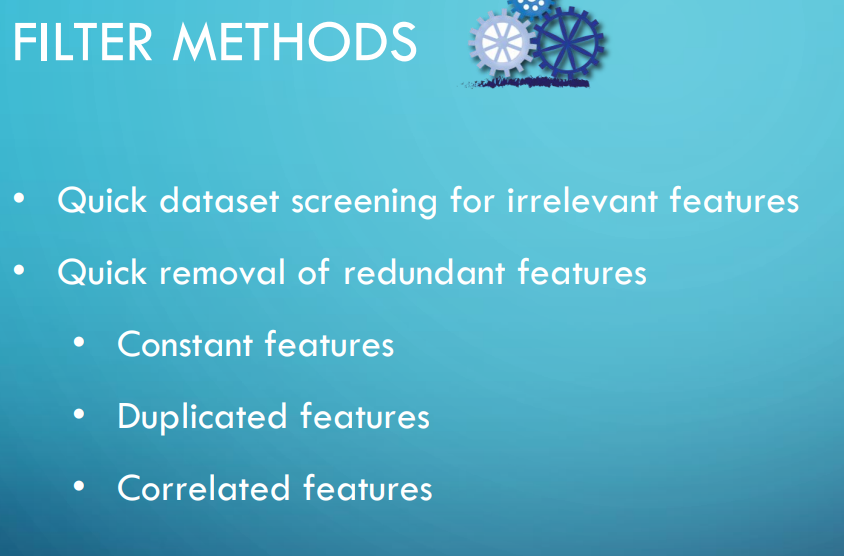

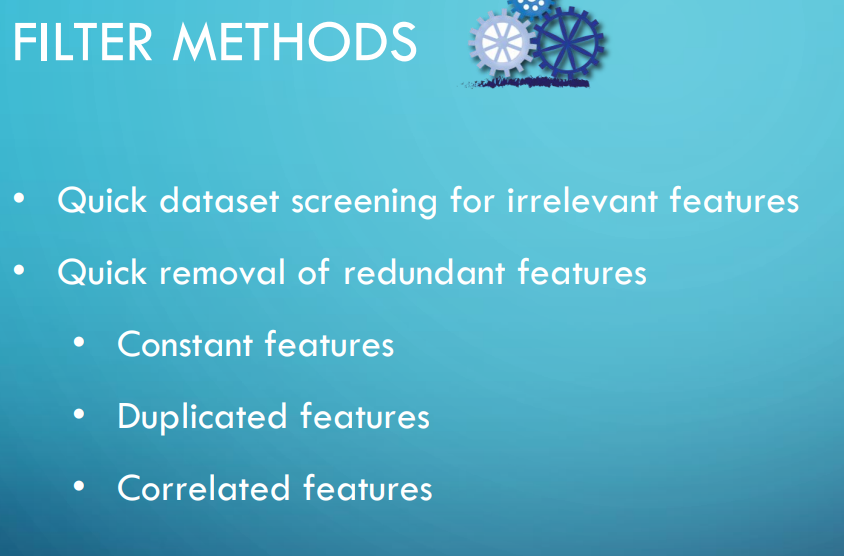

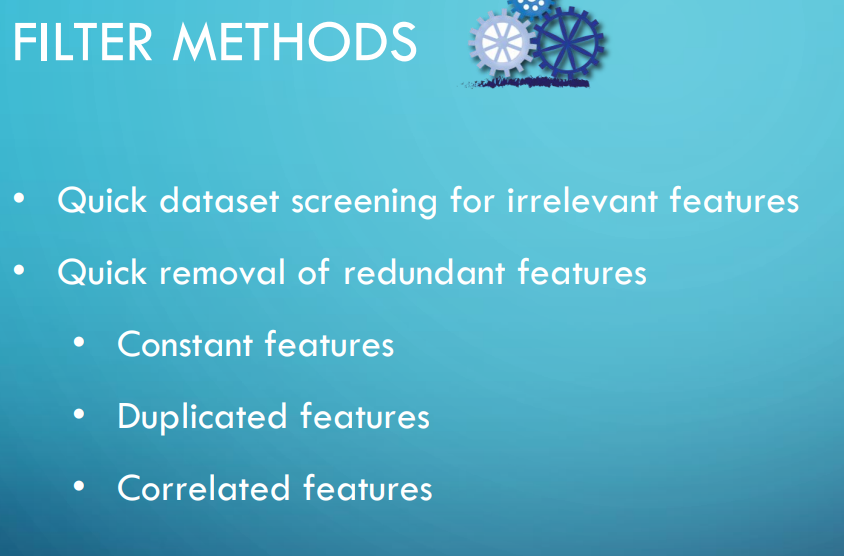

# Filter Method - *** "Basic Methods" ***

1. Remove Constant Features
2. Remove Quasi-Constant Features
3. Remove Duplicated Features

# Method-1 :Remove Constant Features

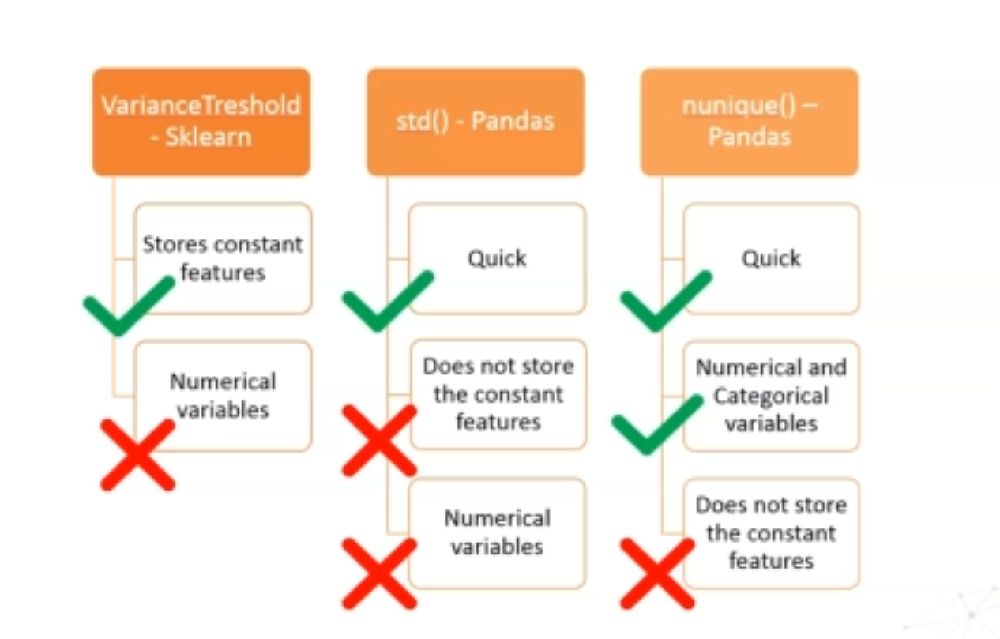

In [1]:
#importing libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
from sklearn.model_selection import train_test_split

from sklearn.feature_selection import VarianceThreshold

In C:\Users\VigneshSS\Anaconda3\envs\new_env\lib\site-packages\matplotlib\mpl-data\stylelib\_classic_test.mplstyle: 
The text.latex.preview rcparam was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
In C:\Users\VigneshSS\Anaconda3\envs\new_env\lib\site-packages\matplotlib\mpl-data\stylelib\_classic_test.mplstyle: 
The mathtext.fallback_to_cm rcparam was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
In C:\Users\VigneshSS\Anaconda3\envs\new_env\lib\site-packages\matplotlib\mpl-data\stylelib\_classic_test.mplstyle: Support for setting the 'mathtext.fallback_to_cm' rcParam is deprecated since 3.3 and will be removed two minor releases later; use 'mathtext.fallback : 'cm' instead.
In C:\Users\VigneshSS\Anaconda3\envs\new_env\lib\site-packages\matplotlib\mpl-data\stylelib\_classic_test.mplstyle: 
The validate_bool_maybe_none function was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
In C:\Users\VigneshSS\An

In [13]:
### Removing Constant Feature
data = pd.read_csv(r'C:/Users/VigneshSS/Desktop/Feature Selection for Machine Learning/precleaned-datasets/dataset_1.csv')
data.head()

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_292,var_293,var_294,var_295,var_296,var_297,var_298,var_299,var_300,target
0,0,0,0.0,0.00,0.0,0,0,0,0,0,...,0.0,0,0,0,0,0,0,0.0,0.0000,0
1,0,0,0.0,3.00,0.0,0,0,0,0,0,...,0.0,0,0,0,0,0,0,0.0,0.0000,0
2,0,0,0.0,5.88,0.0,0,0,0,0,0,...,0.0,0,0,3,0,0,0,0.0,67772.7216,0
3,0,0,0.0,14.10,0.0,0,0,0,0,0,...,0.0,0,0,0,0,0,0,0.0,0.0000,0
4,0,0,0.0,5.76,0.0,0,0,0,0,0,...,0.0,0,0,0,0,0,0,0.0,0.0000,0


In [9]:
# separate dataset into train and test
X_train, X_test, y_train, y_test = train_test_split(
    data.drop(labels=['target'], axis=1),  # drop the target
    data['target'],  # just the target
    test_size=0.3,
    random_state=0)

X_train.shape, X_test.shape

((35000, 300), (15000, 300))

### Using VarianceThreshold from Scikit-learn

The VarianceThreshold from sklearn provides a simple baseline approach to feature selection. It removes all features which variance doesn’t meet a certain threshold. By default, it removes all zero-variance features, i.e., features that have the same value in all samples.

In [10]:
sel = VarianceThreshold(threshold=0)

sel.fit(X_train)  # fit finds the features with zero variance

VarianceThreshold(threshold=0)

In [11]:
sum(sel.get_support())#get_support provide boolean values

266

In [12]:
# now let's print the number of constant feautures # (see how we use ~ to exclude non-constant features)

constant = X_train.columns[~sel.get_support()]

len(constant)

34

In [13]:
# let's print the constant variable names
constant

Index(['var_23', 'var_33', 'var_44', 'var_61', 'var_80', 'var_81', 'var_87',
       'var_89', 'var_92', 'var_97', 'var_99', 'var_112', 'var_113', 'var_120',
       'var_122', 'var_127', 'var_135', 'var_158', 'var_167', 'var_170',
       'var_171', 'var_178', 'var_180', 'var_182', 'var_195', 'var_196',
       'var_201', 'var_212', 'var_215', 'var_225', 'var_227', 'var_248',
       'var_294', 'var_297'],
      dtype='object')

In [14]:
# let's visualise the values of one of the constant variables
# as an example

X_train['var_23'].unique()

array([0], dtype=int64)

In [15]:
# we can do the same for every feature:

for col in constant:
    print(col, X_train[col].unique())

var_23 [0]
var_33 [0]
var_44 [0]
var_61 [0]
var_80 [0]
var_81 [0]
var_87 [0]
var_89 [0.]
var_92 [0]
var_97 [0]
var_99 [0]
var_112 [0]
var_113 [0]
var_120 [0]
var_122 [0]
var_127 [0]
var_135 [0]
var_158 [0]
var_167 [0]
var_170 [0]
var_171 [0]
var_178 [0.]
var_180 [0.]
var_182 [0]
var_195 [0]
var_196 [0]
var_201 [0]
var_212 [0]
var_215 [0]
var_225 [0]
var_227 [0.]
var_248 [0]
var_294 [0]
var_297 [0]


In [17]:
# capture non-constant feature names
feat_names = X_train.columns[sel.get_support()]

X_train = sel.transform(X_train)
X_test = sel.transform(X_test)

X_train.shape, X_test.shape

((35000, 266), (15000, 266))

In [18]:
# reconstitute de dataframe
X_train = pd.DataFrame(X_train, columns=feat_names)
X_train.head()

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_289,var_290,var_291,var_292,var_293,var_295,var_296,var_298,var_299,var_300
0,0.0,0.0,0.0,2.79,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,2.97,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,2.79,85435.2,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,5.70,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


### METHOD 2 : Manual code 1: only works with numerical

In the following cells, I will show an alternative to the VarianceThreshold transformer of sklearn, were we write the code to find out constant variables, using the standard deviation from pandas.

In [20]:
# separate train and test (again, as we transformed the previous ones)

X_train, X_test, y_train, y_test = train_test_split(
    data.drop(labels=['target'], axis=1),
    data['target'],
    test_size=0.3,
    random_state=0)

X_train.shape, X_test.shape

((35000, 300), (15000, 300))

In [21]:
# short and easy: find constant features # in this dataset, all features are numeric,# so this bit of code will suffice:

constant_features = [
    feat for feat in X_train.columns if X_train[feat].std() == 0
]

len(constant_features)

34

In [22]:
# drop these columns from the train and test sets:

X_train.drop(labels=constant_features, axis=1, inplace=True)
X_test.drop(labels=constant_features, axis=1, inplace=True)

X_train.shape, X_test.shape

((35000, 266), (15000, 266))

We see how by removing constant features, we managed to reduced the feature space quite a bit.

Both the VarianceThreshold and the snippet of code I provided work with numerical variables. What can we do to find constant categorical variables?

One alternative is to encode the categories as numbers and then use the code above. But then you will put effort in pre-processing variables that are not informative.

The code below offers a better solution:

### Manual Code 2 - works also with categorical variables

In [23]:
# separate train and test (again, as we transformed the previous ones)

X_train, X_test, y_train, y_test = train_test_split(
    data.drop(labels=['target'], axis=1),
    data['target'],
    test_size=0.3,
    random_state=0)

X_train.shape, X_test.shape

((35000, 300), (15000, 300))

In [24]:
# I will cast all the numeric features as object,
# to simulate that they are categorical

X_train = X_train.astype('O')
X_train.dtypes

var_1      object
var_2      object
var_3      object
var_4      object
var_5      object
            ...  
var_296    object
var_297    object
var_298    object
var_299    object
var_300    object
Length: 300, dtype: object

In [25]:
# to find variables that contain only 1 label/value
# we use the nunique() method from pandas, which returns the number
# of different values in a variable.

constant_features = [
    feat for feat in X_train.columns if X_train[feat].nunique() == 1
]

len(constant_features)

34

**Note** by default nunique() ignores missing values, so if your variables have missing values, use dropna=False within the parameters of nunique().

In [26]:
X_train.drop(labels=constant_features, axis=1, inplace=True)
X_test.drop(labels=constant_features, axis=1, inplace=True)

X_train.shape, X_test.shape

((35000, 266), (15000, 266))

# Method-2 : Remove Quasi-Constant Features

Quasi-constant features are those that show the same value for the great majority of the observations of the dataset. In general, these features provide little, if any, information that allows a machine learning model to discriminate or predict a target. But there can be exceptions. 

To identify quasi-constant features, we can use the VarianceThreshold from Scikit-learn, If we use the VarianceThreshold, all our variables need to be numerical. If we code it manually however, we can apply the code to both numerical and categorical variables.

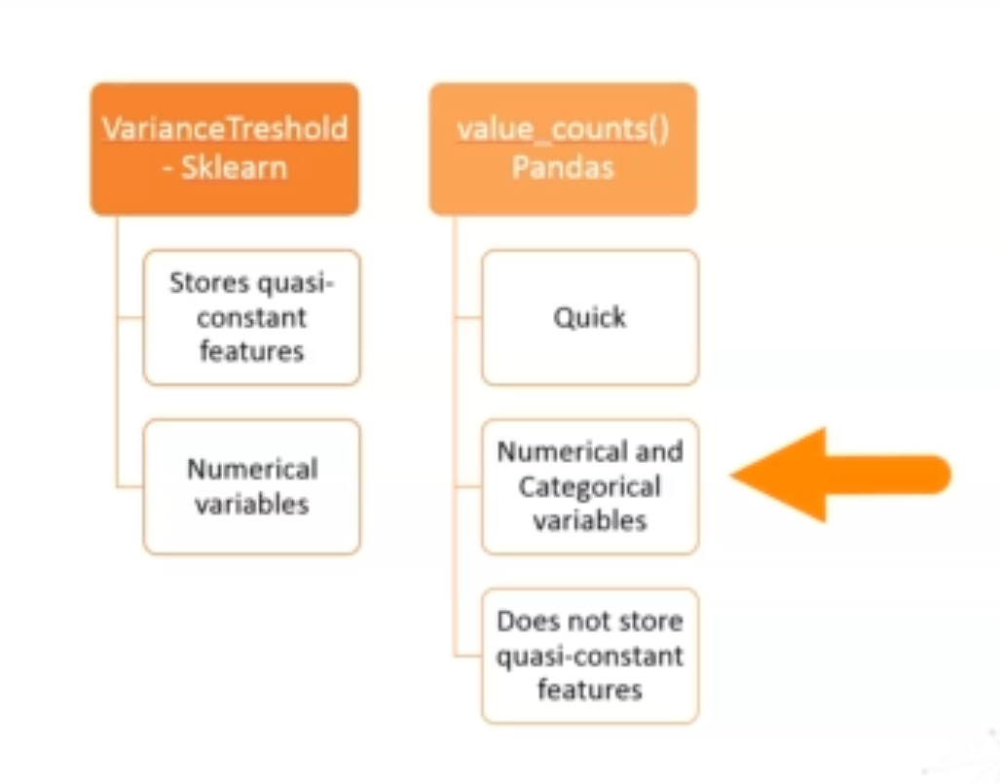

In [27]:
# separate dataset into train and test

X_train, X_test, y_train, y_test = train_test_split(
    data.drop(labels=['target'], axis=1), # drop the target
    data['target'], # just the target
    test_size=0.3,
    random_state=0)

X_train.shape, X_test.shape

((35000, 300), (15000, 300))

## Remove constant features

First, I will remove constant features like I did in the previous lecture. This will allow a better visualisation of the quasi-constant ones.

In [28]:
# using the code from the previous lecture
# I remove 34 constant features

constant_features = [
    feat for feat in X_train.columns if X_train[feat].std() == 0
]

X_train.drop(labels=constant_features, axis=1, inplace=True)
X_test.drop(labels=constant_features, axis=1, inplace=True)

X_train.shape, X_test.shape

((35000, 266), (15000, 266))

##  Remove quasi-constant features

### Using the VarianceThreshold from sklearn

The VarianceThreshold from sklearn provides a simple baseline approach to feature selection. It removes all features which variance doesn’t meet a certain threshold. By default, it removes all zero-variance features, as we did in the previous notebook.

Here, we will change the default threshold to remove quasi-constant features, or, I should better say, features with low-variance:

Check the Scikit-learn docs for more details:
https://scikit-learn.org/stable/modules/generated/sklearn.feature_selection.VarianceThreshold.html


![image.png](attachment:image.png)

In [29]:
sel = VarianceThreshold(threshold=0.01)  

sel.fit(X_train)  # fit finds the features with low variance

VarianceThreshold(threshold=0.01)

In [30]:
sum(sel.get_support())

215

In [31]:
# let's print the number of quasi-constant feautures

quasi_constant = X_train.columns[~sel.get_support()]

len(quasi_constant)

51

We can see that 51 columns / variables are almost constant. This means that 51 variables show predominantly one value for the majority of observations of the training set. Let's explore a few if these variables below.

In [32]:
# let's print the variable names
quasi_constant

Index(['var_1', 'var_2', 'var_7', 'var_9', 'var_10', 'var_19', 'var_28',
       'var_36', 'var_43', 'var_45', 'var_53', 'var_56', 'var_59', 'var_66',
       'var_67', 'var_69', 'var_71', 'var_104', 'var_106', 'var_116',
       'var_133', 'var_137', 'var_141', 'var_146', 'var_177', 'var_187',
       'var_189', 'var_194', 'var_197', 'var_198', 'var_202', 'var_218',
       'var_219', 'var_223', 'var_233', 'var_234', 'var_235', 'var_245',
       'var_247', 'var_249', 'var_250', 'var_251', 'var_256', 'var_260',
       'var_267', 'var_274', 'var_282', 'var_285', 'var_287', 'var_289',
       'var_298'],
      dtype='object')

In [33]:
# capture feature names

feat_names = X_train.columns[sel.get_support()]

In [34]:
#remove the quasi-constant features

X_train = sel.transform(X_train)
X_test = sel.transform(X_test)

X_train.shape, X_test.shape

((35000, 215), (15000, 215))

In [35]:
# trasnform the array into a dataframe

X_train = pd.DataFrame(X_train, columns=feat_names)
X_test = pd.DataFrame(X_test, columns=feat_names)

X_test.head()

,var_3,var_4,var_5,var_6,var_8,var_11,var_12,var_13,var_14,var_15,...,var_286,var_288,var_290,var_291,var_292,var_293,var_295,var_296,var_299,var_300
0,0.0,2.79,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,2.94,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,...,0.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0
3,0.0,2.76,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,2.94,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


### Coding it ourselves

First, I will separate the dataset into train and test and remove the constant features again. Then, I will provide an alternative method to find out quasi-constant features.

This method, as opposed to the VarianceThreshold, can be used for both **numerical and categorical** variables.

In [36]:
# separate train and test
X_train, X_test, y_train, y_test = train_test_split(
    data.drop(labels=['target'], axis=1),
    data['target'],
    test_size=0.3,
    random_state=0)

# remove constant features
# using the code from the previous lecture

constant_features = [
    feat for feat in X_train.columns if X_train[feat].std() == 0
]

X_train.drop(labels=constant_features, axis=1, inplace=True)
X_test.drop(labels=constant_features, axis=1, inplace=True)

X_train.shape, X_test.shape

((35000, 266), (15000, 266))

In [37]:
# create an empty list
quasi_constant_feat = []

# iterate over every feature
for feature in X_train.columns:

    # find the predominant value, that is the value that is shared
    # by most observations
    predominant = (X_train[feature].value_counts() / np.float(
        len(X_train))).sort_values(ascending=False).values[0]

    # evaluate the predominant feature: do more than 99% of the observations
    # show 1 value?
    if predominant > 0.998:
        
        # if yes, add the variable to the list
        quasi_constant_feat.append(feature)

len(quasi_constant_feat)

108

In [39]:
# print the feature names

quasi_constant_feat

['var_1',
 'var_2',
 'var_3',
 'var_6',
 'var_7',
 'var_9',
 'var_10',
 'var_11',
 'var_12',
 'var_14',
 'var_16',
 'var_20',
 'var_24',
 'var_28',
 'var_32',
 'var_34',
 'var_36',
 'var_39',
 'var_40',
 'var_42',
 'var_43',
 'var_45',
 'var_48',
 'var_53',
 'var_56',
 'var_59',
 'var_60',
 'var_65',
 'var_66',
 'var_67',
 'var_69',
 'var_71',
 'var_72',
 'var_73',
 'var_77',
 'var_78',
 'var_90',
 'var_95',
 'var_98',
 'var_102',
 'var_104',
 'var_106',
 'var_111',
 'var_115',
 'var_116',
 'var_124',
 'var_125',
 'var_126',
 'var_129',
 'var_130',
 'var_133',
 'var_136',
 'var_138',
 'var_141',
 'var_142',
 'var_146',
 'var_149',
 'var_150',
 'var_151',
 'var_153',
 'var_159',
 'var_183',
 'var_184',
 'var_187',
 'var_189',
 'var_197',
 'var_202',
 'var_204',
 'var_210',
 'var_211',
 'var_216',
 'var_217',
 'var_219',
 'var_221',
 'var_223',
 'var_224',
 'var_228',
 'var_233',
 'var_234',
 'var_235',
 'var_236',
 'var_237',
 'var_239',
 'var_243',
 'var_245',
 'var_246',
 'var_247',
 

In [41]:
X_train['var_37'].value_counts() / np.float(len(X_train))

0     0.976371
3     0.020343
6     0.002657
9     0.000429
12    0.000114
21    0.000029
15    0.000029
33    0.000029
Name: var_37, dtype: float64

The feature shows 0 for more than 99.9% of the observations. But, it also shows a few different values for a very tiny proportion of the observations. This fact, will increase the feature variance, that is why, this feature is not captured by the VarianceThreshold in our previous cell. Yet, we can see that it is quasi-constant.

Keep in mind that the thresholds are arbitrary and decided by the user.

In [38]:
# finally, let's drop the quasi-constant features:

X_train.drop(labels=quasi_constant_feat, axis=1, inplace=True)
X_test.drop(labels=quasi_constant_feat, axis=1, inplace=True)

X_train.shape, X_test.shape

((35000, 158), (15000, 158))

We see, how, we removed almost half of the original variables!!! We passed from 300 variables to 158.

## Method-3: Remove Duplicated features

Often datasets contain duplicated features, that is, features that despite having different names, are identical.

In addition, we may often introduce duplicated features when performing **one hot encoding** of categorical variables, particularly if our datasets have many and /or highly cardinal categorical variables.

Identifying and removing duplicated, and therefore redundant features, is an easy first step towards feature selection and more interpretable machine learning models.

Here I will demonstrate how to identify duplicated features using a dataset that I created for this course. 

There is no function in Pandas to find duplicated columns. So we need to write a bit code to do so.

**Note**
Finding duplicated features can be a computationally costly operation in Python, therefore depending on the size of your dataset, you might not always be able to do it.

This method that I describe here to find duplicated features works for both **numerical and categorical** variables.

In [43]:
# check the presence of missing data.
# (there are no missing data in this dataset)

[col for col in data.columns if data[col].isnull().sum() > 0]

[]

In [42]:
# separate dataset into train and test

X_train, X_test, y_train, y_test = train_test_split(
    data.drop(labels=['target'], axis=1), # drop the target
    data['target'], # just the target
    test_size=0.3,
    random_state=0)

X_train.shape, X_test.shape

((35000, 300), (15000, 300))

# Remove constant and quasi-constant

In [44]:
# remove constant and quasi-constant features first:
# we can remove the 2 types of features together with this code
# (we used it in our previous notebook)

# create an empty list
quasi_constant_feat = []

# iterate over every feature
for feature in X_train.columns:

    # find the predominant value, that is the value that is shared
    # by most observations
    predominant = (X_train[feature].value_counts() / np.float(
        len(X_train))).sort_values(ascending=False).values[0]

    # evaluate predominant feature: do more than 99% of the observations
    # show 1 value?
    if predominant > 0.998:
        quasi_constant_feat.append(feature)

len(quasi_constant_feat)

142

In [45]:
# we can then drop these columns from the train and test sets:

X_train.drop(labels=quasi_constant_feat, axis=1, inplace=True)
X_test.drop(labels=quasi_constant_feat, axis=1, inplace=True)

X_train.shape, X_test.shape

((35000, 158), (15000, 158))

##  Remove duplicated features

To identify duplicated variables we need to iterate through all features of our dataset, and for each and every feature, try and find others that are identical, or duplicates.

We will create a dictionary of {variable: duplicated variables} pairs to identify them more easily throughout the demo. Keep in mind that in a dataset, there could be 2 or more features that are identical to each other.

In [46]:
# check for duplicated features in the training set:

# create an empty dictionary, where we will store 
# the groups of duplicates
duplicated_feat_pairs = {}

# create an empty list to collect features
# that were found to be duplicated
_duplicated_feat = []


# iterate over every feature in our dataset:
for i in range(0, len(X_train.columns)):
    
    # this bit helps me understand where the loop is at:
    if i % 10 == 0:  
        print(i)
    
    # choose 1 feature:
    feat_1 = X_train.columns[i]
    
    # check if this feature has already been identified
    # as a duplicate of another one. If it was, it should be stored in
    # our _duplicated_feat list.
    
    # If this feature was already identified as a duplicate, we skip it, if
    # it has not yet been identified as a duplicate, then we proceed:
    if feat_1 not in _duplicated_feat:
    
        # create an empty list as an entry for this feature in the dictionary:
        duplicated_feat_pairs[feat_1] = []

        # now, iterate over the remaining features of the dataset:
        for feat_2 in X_train.columns[i + 1:]:

            # check if this second feature is identical to the first one
            if X_train[feat_1].equals(X_train[feat_2]):

                # if it is identical, append it to the list in the dictionary
                duplicated_feat_pairs[feat_1].append(feat_2)
                
                # and append it to our monitor list for duplicated variables
                _duplicated_feat.append(feat_2)
                
                # done!

0
10
20
30
40
50
60
70
80
90
100
110
120
130
140
150


In [47]:
# let's explore our list of duplicated features
len(_duplicated_feat)

6

In [48]:
# these are the ones:

_duplicated_feat

['var_148', 'var_199', 'var_296', 'var_250', 'var_232', 'var_269']

In [49]:
# let's explore the dictionary we created:
duplicated_feat_pairs

{'var_4': [],
 'var_5': [],
 'var_8': [],
 'var_13': [],
 'var_15': [],
 'var_17': [],
 'var_18': [],
 'var_19': [],
 'var_21': [],
 'var_22': [],
 'var_25': [],
 'var_26': [],
 'var_27': [],
 'var_29': [],
 'var_30': [],
 'var_31': [],
 'var_35': [],
 'var_37': ['var_148'],
 'var_38': [],
 'var_41': [],
 'var_46': [],
 'var_47': [],
 'var_49': [],
 'var_50': [],
 'var_51': [],
 'var_52': [],
 'var_54': [],
 'var_55': [],
 'var_57': [],
 'var_58': [],
 'var_62': [],
 'var_63': [],
 'var_64': [],
 'var_68': [],
 'var_70': [],
 'var_74': [],
 'var_75': [],
 'var_76': [],
 'var_79': [],
 'var_82': [],
 'var_83': [],
 'var_84': ['var_199'],
 'var_85': [],
 'var_86': [],
 'var_88': [],
 'var_91': [],
 'var_93': [],
 'var_94': [],
 'var_96': [],
 'var_100': [],
 'var_101': [],
 'var_103': [],
 'var_105': [],
 'var_107': [],
 'var_108': [],
 'var_109': [],
 'var_110': [],
 'var_114': [],
 'var_117': [],
 'var_118': [],
 'var_119': [],
 'var_121': [],
 'var_123': [],
 'var_128': [],
 'var_131'

In [50]:
# let's explore the number of keys in our dictionary

# we see it is 152, because 6 of the 158 were duplicates,
# so they were not included as keys

print(len(duplicated_feat_pairs.keys()))

152


In [51]:
# print the features with its duplicates

# iterate over every feature in our dict:
for feat in duplicated_feat_pairs.keys():
    
    # if it has duplicates, the list should not be empty:
    if len(duplicated_feat_pairs[feat]) > 0:

        # print the feature and its duplicates:
        print(feat, duplicated_feat_pairs[feat])
        print()

var_37 ['var_148']

var_84 ['var_199']

var_143 ['var_296']

var_177 ['var_250']

var_226 ['var_232']

var_229 ['var_269']



In [52]:
# let's check that indeed those features are duplicated
# I select a pair from above

X_train[['var_37', 'var_148']].head(10)

,var_37,var_148
17967,0,0
32391,0,0
9341,0,0
7929,0,0
46544,0,0
4149,0,0
33426,0,0
3002,0,0
6974,0,0
16864,0,0


In [53]:
X_train['var_37'].unique()

array([ 0,  3,  6,  9, 12, 21, 33, 15], dtype=int64)

In [54]:
# let's explore parts of the dataframe where the values in
# these features are different from 0:

X_train[X_train['var_37'] != 0][['var_37', 'var_148']].head(10)

,var_37,var_148
37493,3,3
20251,6,6
4264,6,6
48480,3,3
31607,3,3
41172,3,3
13502,3,3
7759,3,3
46118,3,3
2638,3,3


As we see, these features are indeed identical :)

There are more duplicated features in this dataset, which we removed because they are constant or quasi-constant. So as an exercise, why don't you try and find which additional features in this dataset are duplicates?

In [55]:
# finally, to remove the duplicates, what we are going to do is to retain
# the keys of the dictionary

# do you understand why? if not, go back to our loop in cell 7 and try to 
# determine the reason

X_train = X_train[duplicated_feat_pairs.keys()]
X_test = X_test[duplicated_feat_pairs.keys()]

X_train.shape, X_test.shape

((35000, 152), (15000, 152))

In summary, by removing constant, quasi-constant and duplicated features, we reduced our original **300** feature dataset to a **152** feature dataset. Well done us!

 # Filter Method - *** "Correlation" ***
 
 ## Correlation

Correlation Feature Selection evaluates subsets of features on the basis of the following hypothesis: "Good feature subsets contain features highly correlated with the target, yet uncorrelated to each other".

 how to select features based on correlation using 2 procedures:

The first one is a brute force function that finds correlated features without any further insight. 

The second procedure finds groups of correlated features, which we can then explore to decide which one we keep and which ones we discard.

Often, more than 2 features are correlated with each other. We can find groups of 3, 4 or more features that are correlated. By identifying these groups, with procedure 2, we can then select from each group, which feature we want to keep, and which ones we want to remove.

**Note**

The most used method to determine correlation is the Pearson's correlation method.

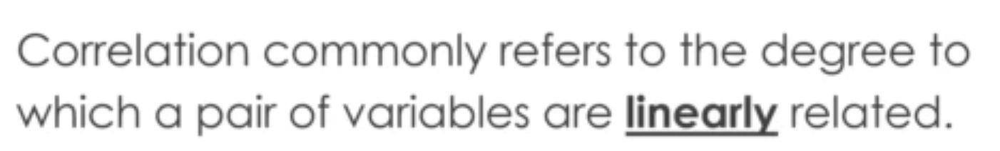

# Linear Relationship

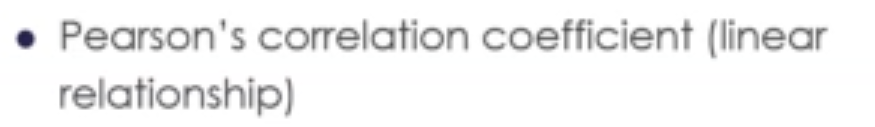

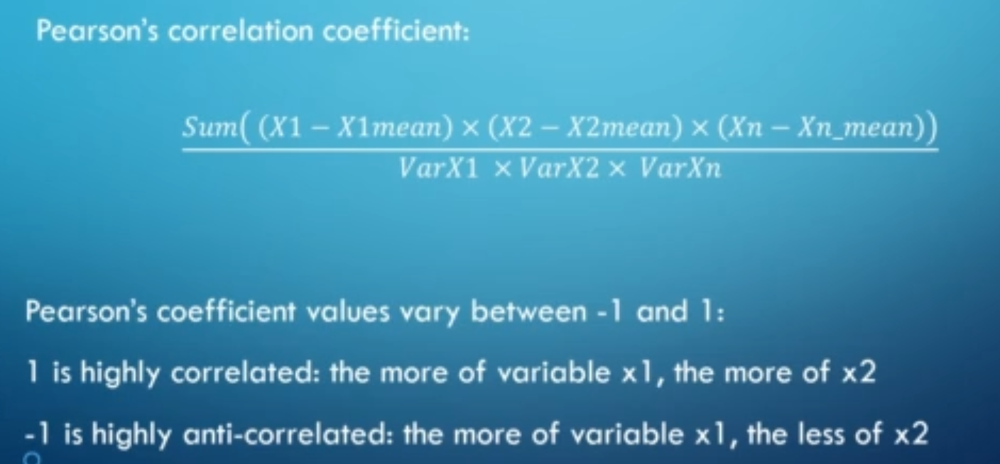

# Non Linear Relationship

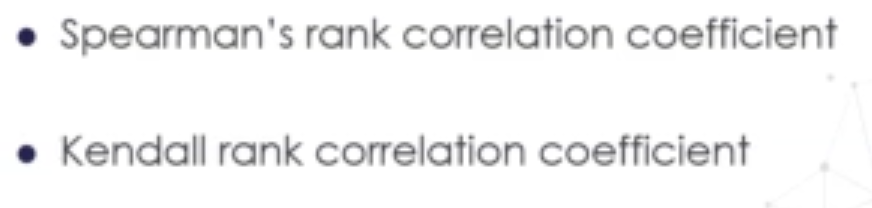

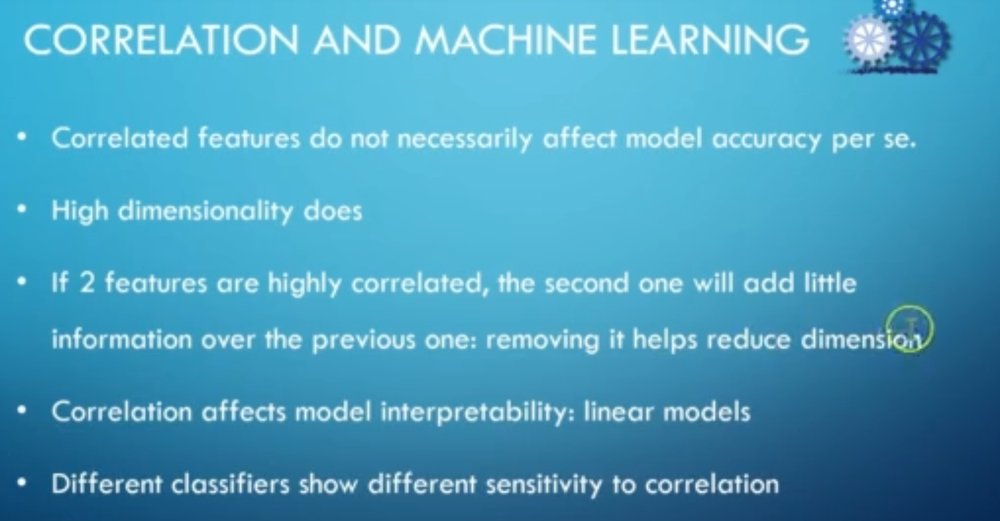

In [5]:
# load dataset

data2 = pd.read_csv(r'C:/Users/VigneshSS/Desktop/Feature Selection for Machine Learning/precleaned-datasets/dataset_2.csv', nrows=50000)
data2.shape

(50000, 109)

In [6]:
data2.head()

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_100,var_101,var_102,var_103,var_104,var_105,var_106,var_107,var_108,var_109
0,4.532710,3.280834,17.982476,4.404259,2.349910,0.603264,2.784655,0.323146,12.009691,0.139346,...,2.079066,6.748819,2.941445,18.360496,17.726613,7.774031,1.473441,1.973832,0.976806,2.541417
1,5.821374,12.098722,13.309151,4.125599,1.045386,1.832035,1.833494,0.709090,8.652883,0.102757,...,2.479789,7.795290,3.557890,17.383378,15.193423,8.263673,1.878108,0.567939,1.018818,1.416433
2,1.938776,7.952752,0.972671,3.459267,1.935782,0.621463,2.338139,0.344948,9.937850,11.691283,...,1.861487,6.130886,3.401064,15.850471,14.620599,6.849776,1.098210,1.959183,1.575493,1.857893
3,6.020690,9.900544,17.869637,4.366715,1.973693,2.026012,2.853025,0.674847,11.816859,0.011151,...,1.340944,7.240058,2.417235,15.194609,13.553772,7.229971,0.835158,2.234482,0.946170,2.700606
4,3.909506,10.576516,0.934191,3.419572,1.871438,3.340811,1.868282,0.439865,13.585620,1.153366,...,2.738095,6.565509,4.341414,15.893832,11.929787,6.954033,1.853364,0.511027,2.599562,0.811364


In [7]:
data = data2.copy()

In [61]:
# separate train and test sets
X_train, X_test, y_train, y_test = train_test_split(
    data.drop(labels=['target'], axis=1),
    data['target'],
    test_size=0.3,
    random_state=0)

X_train.shape, X_test.shape

((35000, 108), (15000, 108))

## Correlation heatmap

<AxesSubplot:>

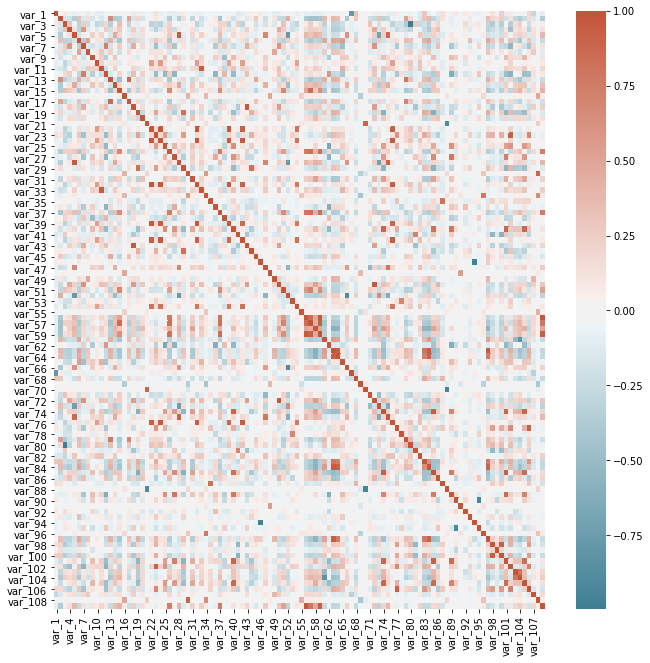

In [66]:
# visualise correlated features:

# the default correlation method of pandas.corr is pearson
# I include it anyways for the demo
corrmat = X_train.corr(method='pearson')

# we can make a heatmap with the package seaborn
# and customise the colours of searborn's heatmap
cmap = sns.diverging_palette(220, 20, as_cmap=True)

# some more parameters for the figure
fig, ax = plt.subplots()
fig.set_size_inches(11,11)

# and now plot the correlation matrix
sns.heatmap(corrmat, cmap=cmap)

## Correlation scatterplots

In [67]:
# Looking at the heatmap, we see that var25 is highly correlated 
# with others in the dataset

# with this code we can get the other variable names
# and also print the correlation coefficient between var25 and 
# these variables:

c = 0

# iterate over each correlation value for var_5:
for i in corrmat.loc['var_5']:
    
    # if highly correlated
    if i>0.8:
        
        # print the variable name and the correlation coefficient
        print(corrmat.columns[c], i)
        
    c = c +1

var_5 1.0
var_28 0.9536721652385074
var_75 0.8616179292025175


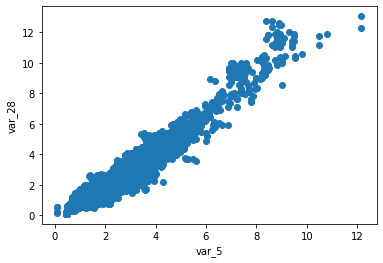

In [68]:
# now, let's plot the variables

plt.scatter(X_train['var_5'], X_train['var_28'])
plt.ylabel('var_28')
plt.xlabel('var_5')
plt.show()

## Remove correlated

### Brute force approach

In [69]:
# with the following function we can select highly correlated features
# it will remove the first feature that is correlated with anything else
# without any further insight.

def correlation(dataset, threshold):
    
    # create a set where I will store the names of correlated columns
    col_corr = set()
    
    # create the correlation matrix
    corr_matrix = dataset.corr()
    
    # for each feature in the dataset (columns of the correlation matrix)
    for i in range(len(corr_matrix.columns)):
        
        # check with other features
        for j in range(i):
            
            # if the correlation is higher than a certain threshold
            if abs(corr_matrix.iloc[i, j]) > threshold: # we are interested in absolute coeff value
                
                # print correlation, and variables examined
                # keep in mind that the columns and rows of the dataframe are identical
                # so we can identify the features being examned by looking for i,j
                # in the column names
                print(abs(corr_matrix.iloc[i, j]), corr_matrix.columns[i], corr_matrix.columns[j])
                
                # get the name of the correlated feature
                colname = corr_matrix.columns[j]
                
                # and add it to our correlated set
                col_corr.add(colname)
                
    return col_corr

In [70]:
corr_features = correlation(X_train, 0.8)
len(set(corr_features))

0.8632980418993852 var_17 var_13
0.9813409653986886 var_24 var_22
0.9536721652385074 var_28 var_5
0.8341792843814487 var_29 var_19
0.9904307349993785 var_32 var_22
0.9804113632495275 var_32 var_24
0.9443605986205716 var_33 var_11
0.9744609333741692 var_39 var_22
0.943115386679052 var_39 var_24
0.9748779191363351 var_39 var_32
0.9191057911749927 var_42 var_22
0.9672922649953323 var_42 var_24
0.9199183443060889 var_42 var_32
0.8567453370819024 var_42 var_39
0.9654741987814612 var_43 var_18
0.8358214281472603 var_44 var_29
0.8150241475398569 var_54 var_24
0.8287090109274778 var_54 var_42
0.8374044816360672 var_57 var_15
0.8318090759398231 var_57 var_26
0.8207993837973165 var_57 var_37
0.8440857367712463 var_57 var_56
0.813194752522628 var_59 var_26
0.8306144274586847 var_59 var_37
0.9757443944210531 var_59 var_56
0.9223172758595206 var_59 var_57
0.9244600573582376 var_64 var_63
0.8925221926487126 var_66 var_52
0.8953971637379001 var_70 var_21
0.9702627369946087 var_72 var_50
0.88311916559

40

In [71]:
X_train.drop(labels=corr_features, axis=1, inplace=True)
X_test.drop(labels=corr_features, axis=1, inplace=True)

X_train.shape, X_test.shape

((35000, 68), (15000, 68))

By removing correlated columns we reduced the feature space from 108 numerical columns to 72.

### Second approach

The second approach looks to identify groups of highly correlated features. And then, we can make further investigation within these groups to decide which feature we keep and which one we remove.

In [72]:
# separate train and test sets
X_train, X_test, y_train, y_test = train_test_split(
    data.drop(labels=['target'], axis=1),
    data['target'],
    test_size=0.3,
    random_state=0)

In [73]:
# build a dataframe with the correlation between features
# remember that the absolute value of the correlation
# coefficient is important and not the sign

corrmat = X_train.corr()
corrmat = corrmat.abs().unstack() # absolute value of corr coef
corrmat = corrmat.sort_values(ascending=False)
corrmat = corrmat[corrmat >= 0.8]
corrmat = corrmat[corrmat < 1]
corrmat = pd.DataFrame(corrmat).reset_index()
corrmat.columns = ['feature1', 'feature2', 'corr']
corrmat.head()

,feature1,feature2,corr
0,var_80,var_3,0.994923
1,var_3,var_80,0.994923
2,var_22,var_32,0.990431
3,var_32,var_22,0.990431
4,var_109,var_56,0.987777


In [74]:
# find groups of correlated features

grouped_feature_ls = []
correlated_groups = []

for feature in corrmat.feature1.unique():
    
    if feature not in grouped_feature_ls:

        # find all features correlated to a single feature
        correlated_block = corrmat[corrmat.feature1 == feature]
        grouped_feature_ls = grouped_feature_ls + list(
            correlated_block.feature2.unique()) + [feature]

        # append the block of features to the list
        correlated_groups.append(correlated_block)

print('found {} correlated groups'.format(len(correlated_groups)))
print('out of {} total features'.format(X_train.shape[1]))

found 26 correlated groups
out of 108 total features


In [75]:
# now we can print out each group. We see that some groups contain
# only 2 correlated features, some other groups present several features 
# that are correlated among themselves.

for group in correlated_groups:
    print(group)
    print()

  feature1 feature2      corr
0   var_80    var_3  0.994923

   feature1 feature2      corr
2    var_22   var_32  0.990431
6    var_22   var_24  0.981341
15   var_22   var_39  0.974461
45   var_22   var_76  0.931911
59   var_22   var_42  0.919106

   feature1 feature2      corr
4   var_109   var_56  0.987777
34  var_109   var_59  0.944842

   feature1 feature2      corr
16   var_72   var_50  0.970263

   feature1 feature2      corr
18   var_46   var_94  0.967895

   feature1 feature2      corr
22   var_18   var_43  0.965474

   feature1 feature2      corr
26   var_63   var_84  0.959138
41   var_63   var_97  0.940184
52   var_63   var_64  0.924460

   feature1 feature2      corr
30    var_5   var_28  0.953672
94    var_5   var_75  0.861618

   feature1 feature2      corr
32   var_70   var_88  0.948947
72   var_70   var_21  0.895397

   feature1 feature2      corr
36   var_33   var_11  0.944361

   feature1 feature2      corr
42  var_100   var_98  0.938629

    feature1 feature2      cor

In [76]:
# we can now investigate further features within one group.
# let's for example select group 1

group = correlated_groups[1]
group

,feature1,feature2,corr
2,var_22,var_32,0.990431
6,var_22,var_24,0.981341
15,var_22,var_39,0.974461
45,var_22,var_76,0.931911
59,var_22,var_42,0.919106


In [77]:
# we can now investigate further features within one group.
# let's for example select group 1

group = correlated_groups[25]
group

,feature1,feature2,corr
131,var_103,var_104,0.804599


**In this group, several features are highly correlated. Which one should we keep and which ones should we remove?**

One criteria to select which features to use from this group, would be to use those with **less missing data**. 

Our dataset contains no missing values, so this is not an option. But keep this in mind when you work with your own datasets.

Alternatively, we could build a **machine learning algorithm using all the features from the above list, and select the more predictive one**.

In [78]:
from sklearn.ensemble import RandomForestClassifier

# add all features of the group to a list
features = list(group['feature2'].unique())+['var_22']

# train a random forest 
rf = RandomForestClassifier(n_estimators=200, random_state=39, max_depth=4)
rf.fit(X_train[features].fillna(0), y_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=4, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=200,
                       n_jobs=None, oob_score=False, random_state=39, verbose=0,
                       warm_start=False)

In [79]:
# get the feature importance attributed by the 
# random forest model (more on this in coming lectures)

importance = pd.concat(
    [pd.Series(features),
     pd.Series(rf.feature_importances_)], axis=1)

importance.columns = ['feature', 'importance']

# sort features by importance, most important first
importance.sort_values(by='importance', ascending=False)

,feature,importance
1,var_22,0.503971
0,var_104,0.496029


In this case, feature var_22 shows the highest importance according to random forests. Then, I would select var_22, and remove all the remaining features from this group from the dataset.

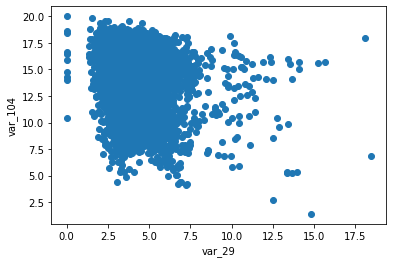

In [82]:
# BONUS:
# let's plot the correlation of the features in the correlated group from the
# previous cell

for feature in group['feature2']:
    plt.scatter(X_train['var_29'], X_train[feature])
    plt.xlabel('var_29')
    plt.ylabel(feature)
    plt.show()

# Statistical measures

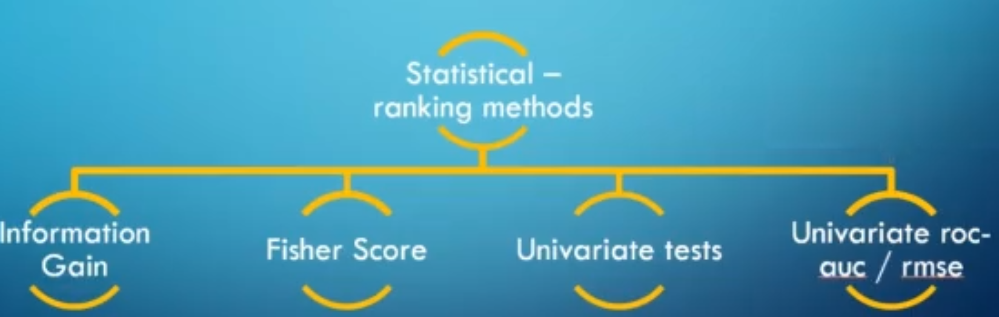

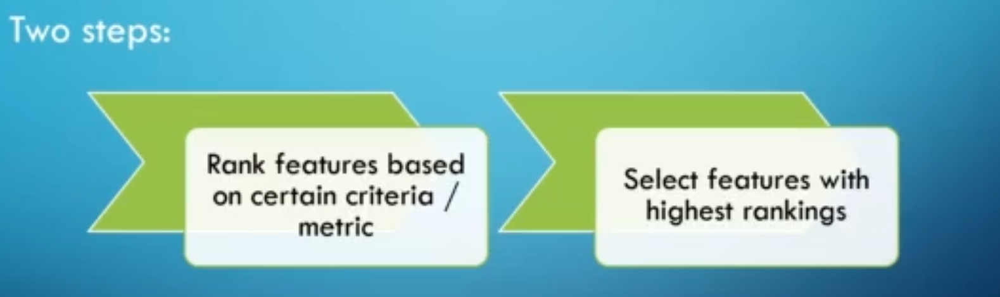

# Mutual Information

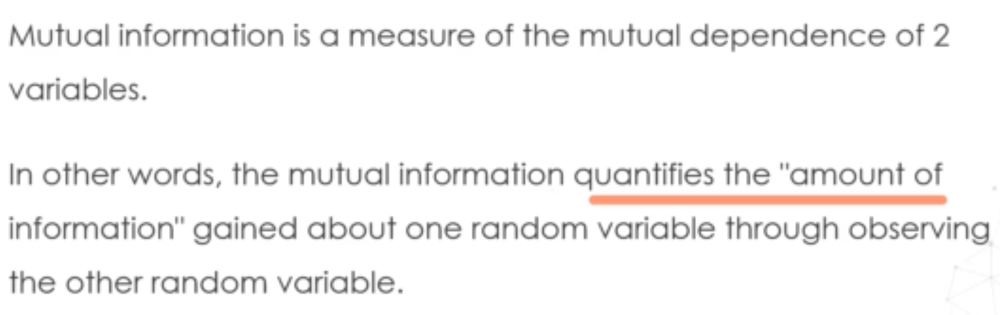

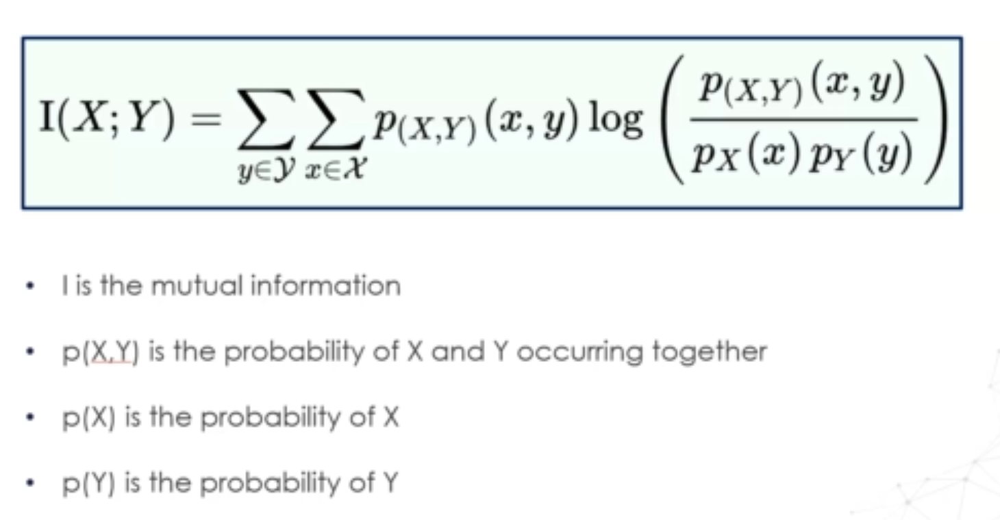

In [2]:
# to obtain the mutual information values
from sklearn.feature_selection import mutual_info_classif, mutual_info_regression
# to select the features
from sklearn.feature_selection import SelectKBest, SelectPercentile  # SelectKBest is for classification and later is for regeression

In [3]:
# load dataset

data = pd.read_csv(r'C:/Users/VigneshSS/Desktop/Feature Selection for Machine Learning/precleaned-datasets/train(1).csv', nrows=50000)
data.shape

(1460, 81)

In [6]:
data.head(2)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500


In [25]:
# In practice, feature selection should be done after data pre-processing,
# so ideally, all the categorical variables are encoded into numbers,
# and then you can assess how deterministic they are of the target

# here for simplicity I will use only numerical variables
# select numerical columns:

numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
numerical_vars = list(data.select_dtypes(include=numerics).columns)
data = data[numerical_vars]
data.shape

(1460, 38)

In [26]:
# separate train and test sets
X_train, X_test, y_train, y_test = train_test_split(
    data.drop(labels=['SalePrice'], axis=1),
    data['SalePrice'],
    test_size=0.3,
    random_state=0)

X_train.shape, X_test.shape

((1022, 37), (438, 37))

In [27]:
## fill missing values

X_train = X_train.fillna(0)
X_test = X_test.fillna(0)

# determine the mutual information

Text(0, 0.5, 'Mutual Information')

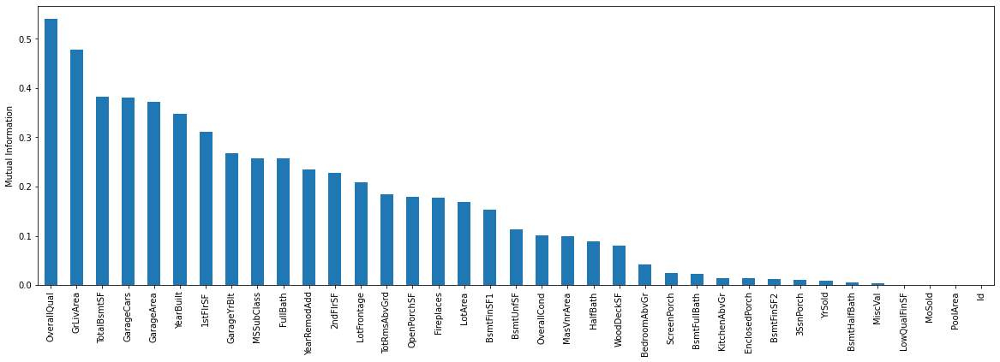

In [29]:
# determine the mutual information
mi = mutual_info_regression(X_train, y_train)

# and make a bar  plot
mi = pd.Series(mi)
mi.index = X_train.columns
mi.sort_values(ascending=False).plot.bar(figsize=(20,6))
plt.ylabel('Mutual Information')

There are a few features (left of the plot) with higher mutual information values. There are also features with almost zero MI values on the right of the plot.


There are a few ways in which this can be done:

- Select top k features, where k is an arbitrary number of features

- Select features in the top n percentile, where n is again an arbitrary number

- Select all features above a certain threshold of MI, arbitrarily decided.

Scikit-learn transformer **SelectKBest**, allows us to automatically select the top k features, based of any statistical value, including the MI.

Sklearn's **SelectPercentile** allows us to select the features in the top percentile of any statistical value, including the MI.

Alternatively, if we want to select features based on a MI threshold, we can do it manually.

### ### Select top 10th percentile features

In [31]:
# Select the features in the top percentile
sel_ = SelectPercentile(mutual_info_regression, percentile=10).fit(X_train, y_train)

# display the features
X_train.columns[sel_.get_support()]

Index(['OverallQual', 'TotalBsmtSF', 'GrLivArea', 'GarageCars'], dtype='object')

In [32]:
# to remove the rest of the features:

X_train = sel_.transform(X_train)
X_test = sel_.transform(X_test)

X_train

array([[7.000e+00, 1.057e+03, 2.034e+03, 2.000e+00],
       [6.000e+00, 1.291e+03, 1.291e+03, 2.000e+00],
       [5.000e+00, 8.580e+02, 8.580e+02, 0.000e+00],
       ...,
       [6.000e+00, 0.000e+00, 1.902e+03, 2.000e+00],
       [7.000e+00, 1.374e+03, 1.557e+03, 2.000e+00],
       [7.000e+00, 1.195e+03, 1.839e+03, 2.000e+00]])

# Chi-Square (Fisher Score)

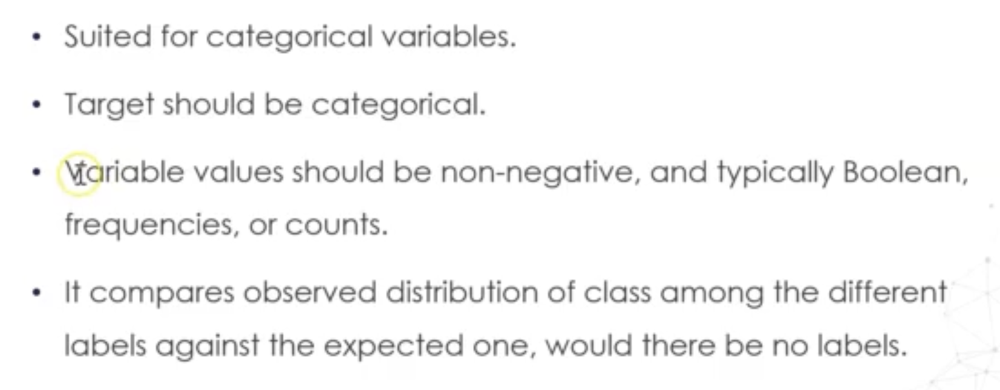

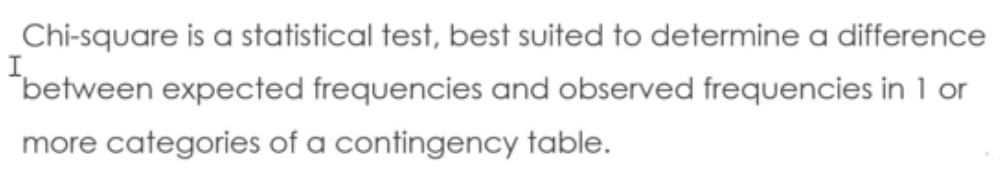

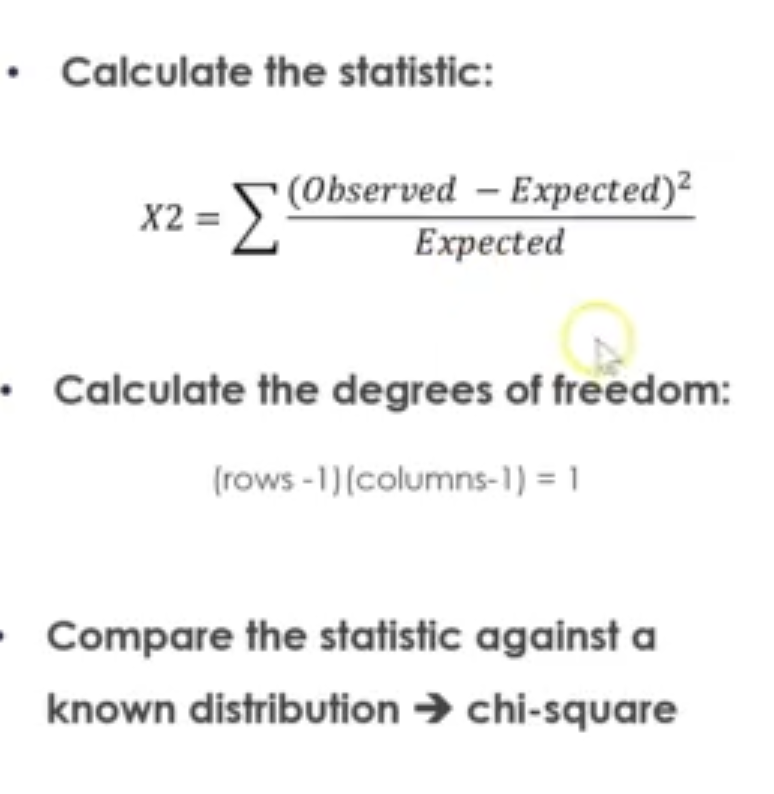

In [33]:
# to determine the chi2 value
from sklearn.feature_selection import chi2
# to select the features
from sklearn.feature_selection import SelectKBest

In [38]:
# load dataset

data = pd.read_csv(r'C:/Users/VigneshSS/Desktop/Feature Selection for Machine Learning/precleaned-datasets/titanic.csv', nrows=50000)
data.shape

(891, 12)

In [39]:
data.head()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S


In [40]:
# the categorical variables in the titanic are pclass, sex and embarked

# first I will encode the labels of the categories into numbers

# for Sex / Gender
data['Sex'] = np.where(data['Sex'] == 'male', 1, 0)

# for Embarked
ordinal_label = {k: i for i, k in enumerate(data['Embarked'].unique(), 0)}
data['Embarked'] = data['Embarked'].map(ordinal_label)

# pclass is already ordinal

In [41]:
# separate train and test sets
X_train, X_test, y_train, y_test = train_test_split(
    data[['Pclass', 'Sex', 'Embarked']],
    data['Survived'],
    test_size=0.3,
    random_state=0)

X_train.shape, X_test.shape

((623, 3), (268, 3))

In [42]:
# calculate the chi2 p_value between each of the variables
# and the target

# chi2 returns 2 arrays, one contains the F-Scores which are then
# evaluated against the chi2 distribution to obtain the pvalue.
# The pvalues are in the second array

f_score = chi2(X_train.fillna(0), y_train)

# the 2 arrays of values
f_score

(array([21.61080949, 63.55447864, 11.83961845]),
 array([3.33964360e-06, 1.55992554e-15, 5.79837058e-04]))

In [43]:
# 1) let's capture the p_values (in the second array, remember python indexes at 0) in a pandas Series
# 2) add the variable names in the index
# 3) order the variables based on their fscore

pvalues = pd.Series(f_score[1])
pvalues.index = X_train.columns
pvalues.sort_values(ascending=True)

Sex         1.559926e-15
Pclass      3.339644e-06
Embarked    5.798371e-04
dtype: float64

In [44]:
sel_ = SelectKBest(chi2, k=1).fit(X_train, y_train)

# display features
X_train.columns[sel_.get_support()]

Index(['Sex'], dtype='object')

In [45]:
# to remove the rest of the features:

X_train = sel_.transform(X_train)
X_test = sel_.transform(X_test)

# ANOVA(Not prefered)

## Univariate feature selection

Univariate feature selection works by selecting the best features based on univariate statistical tests (ANOVA). The methods estimate the degree of linear dependency between two random variables. In this case, any of the predictor variables and the target. 

ANOVA assumes a linear relationship between the feature and the target and that the variables follow a Gaussian distribution. If this is not true, the result of this test may not be useful.

These may not always be the case for the variables in your dataset, so if looking to implement these procedure, you will need to corroborate these assumptions.

I will demonstrate how to select features based on univariate tests using sklearn with a regression and classification dataset.

For the sake of the demonstration, I will assume that the variables show a linear relationship with the target and that they are normally distributed.

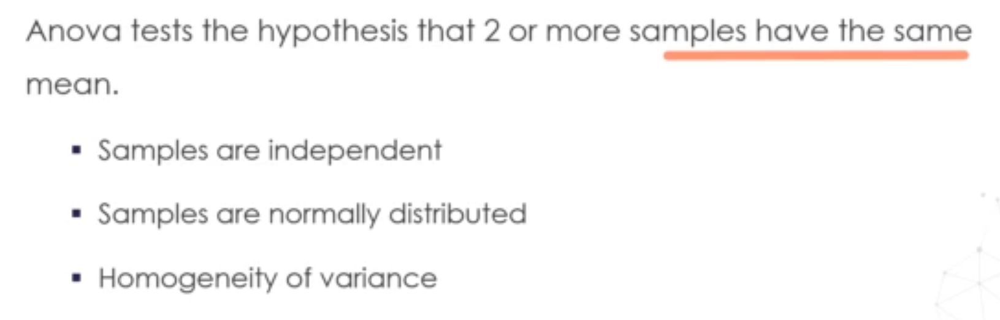

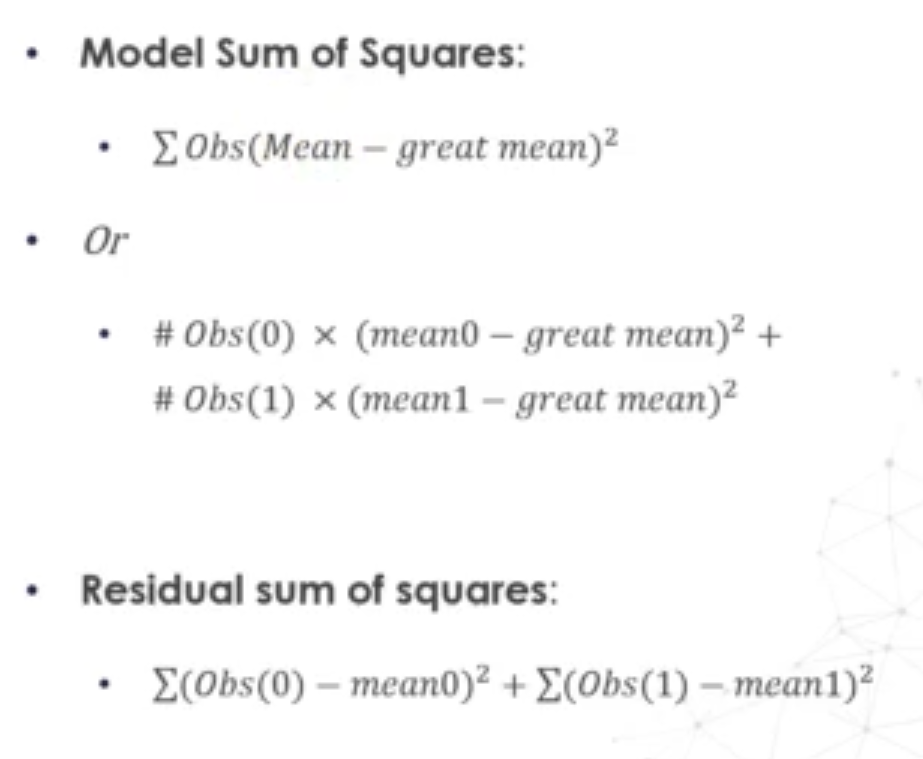

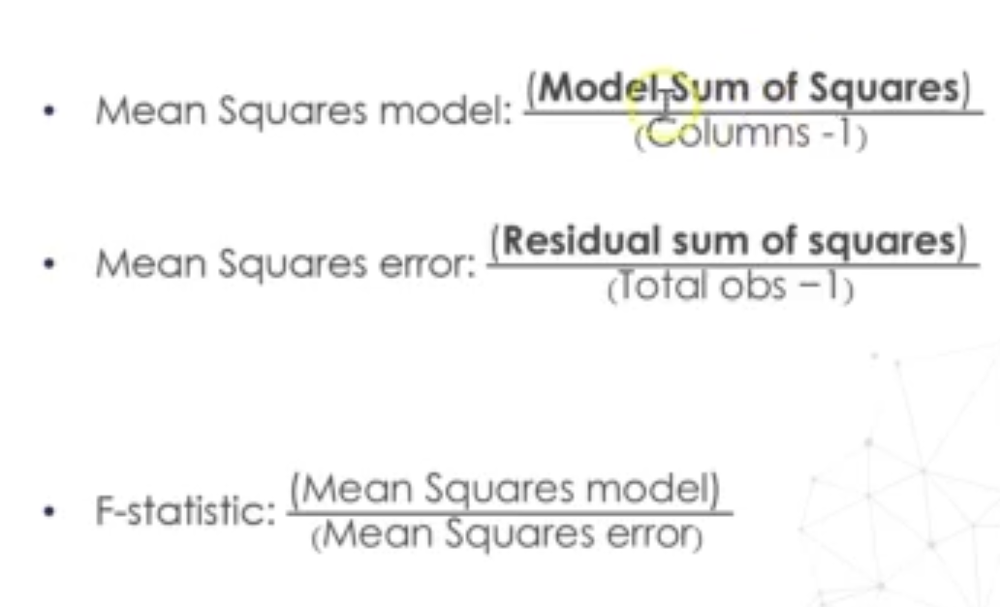

# Packages

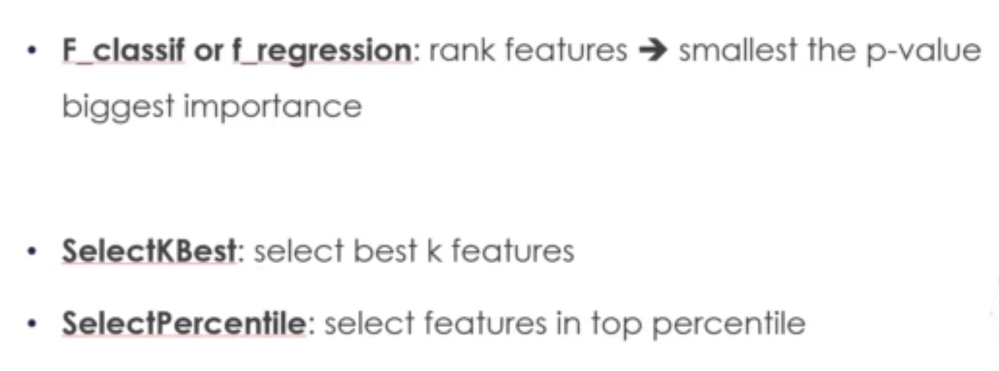

In [46]:
# to determine the p-values with anova
from sklearn.feature_selection import f_classif, f_regression

# to select features
from sklearn.feature_selection import SelectKBest, SelectPercentile

In [49]:
# load dataset

data = pd.read_csv(r'C:/Users/VigneshSS/Desktop/Feature Selection for Machine Learning/precleaned-datasets/dataset_2.csv', nrows=50000)
data.shape

(50000, 109)

In [50]:
# separate train and test sets
X_train, X_test, y_train, y_test = train_test_split(
    data.drop(labels=['target'], axis=1),
    data['target'],
    test_size=0.3,
    random_state=0)

X_train.shape, X_test.shape

((35000, 108), (15000, 108))

### Perform univariate anova

In [51]:
# calculate the univariate statistical measure between
# each of the variables and the target

# similarly to chi2, the output is one array with f-scores
# and one array with the pvalues

univariate = f_classif(X_train, y_train)

univariate

(array([2.92073990e-01, 3.67738039e+01, 1.30411853e+01, 1.17574360e+01,
        1.41563181e+01, 3.06381672e+01, 2.02234060e+01, 2.96271569e+00,
        2.29045228e-01, 3.77443721e+00, 2.90430896e+00, 1.91250548e+01,
        5.05376700e+01, 1.19013857e+01, 2.07311280e+01, 7.33476852e+02,
        4.27044609e+01, 1.27667244e+01, 6.44432030e+00, 1.19060034e+01,
        2.73829670e+02, 3.90587287e+00, 1.12131044e+01, 3.51833011e+00,
        7.22171922e-01, 4.33080273e+01, 1.11696498e+00, 1.35149019e+01,
        7.04378672e-01, 7.82273154e+01, 1.07853079e+01, 5.07871810e+00,
        1.88154600e+00, 5.39927733e+02, 3.35223341e-02, 7.88844093e+00,
        2.39605100e+01, 2.36349439e+01, 5.53456743e+00, 2.23455847e-04,
        1.62264425e+00, 2.64838234e+00, 7.22501472e+00, 1.25555915e+00,
        1.32941890e+01, 3.83273241e+00, 3.27938257e+00, 1.98713697e+02,
        2.76343404e-02, 9.87511329e+00, 1.15466653e+01, 7.89411872e+00,
        2.45008055e+00, 2.00266136e+00, 2.16675637e+03, 1.264599

<AxesSubplot:>

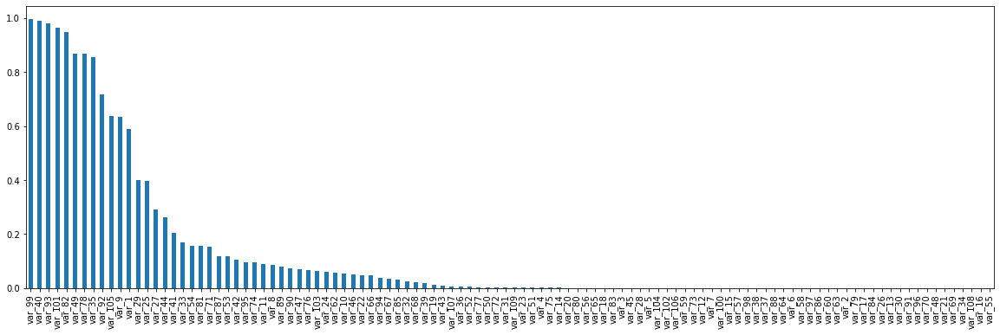

In [52]:
# 1) let's capture the pvalues in a pandas series
# 2) add the variable names in the index
# 3) sort the features based on their anova pvalues
# 4) and make a var plot

univariate = pd.Series(univariate[1])
univariate.index = X_train.columns
univariate.sort_values(ascending=False).plot.bar(figsize=(20, 6))

The smaller the p_value the more predictive the feature is.

Features on the left of the plot are very bad at predicting the target. The most predictive features are on the right of the plot.

**How can we select features based on the anova p-values?**

There are a few ways in which this can be done:

- Select top k features, where k is an arbitrary number of features

- Select features in the top n percentile, where n is again an arbitrary number

- Select all features below a certain threshold, arbitrarily decided.

Scikit-learn transformer **SelectKBest**, allows us to automatically select the top k features, based of any statistical value, including Anova. It will select those with the lowest pvalues.

Sklearn's **SelectPercentile** allows us to select the features in the top percentile of any statistical value, including the anova.

Alternatively, if we want to select features based on a pvalue threshold, we can do it manually.

### Select top 10 features based of univariate anova

In [53]:
# select the top 10 features
sel_ = SelectKBest(f_classif, k=10).fit(X_train, y_train)

# display selected feature names
X_train.columns[sel_.get_support()]

Index(['var_16', 'var_21', 'var_34', 'var_48', 'var_55', 'var_69', 'var_70',
       'var_91', 'var_96', 'var_108'],
      dtype='object')

In [54]:
# remove unwanted features from the dataset

X_train = sel_.transform(X_train)

X_train.shape

(35000, 10)

# Filter Methods - other methods and Metrics

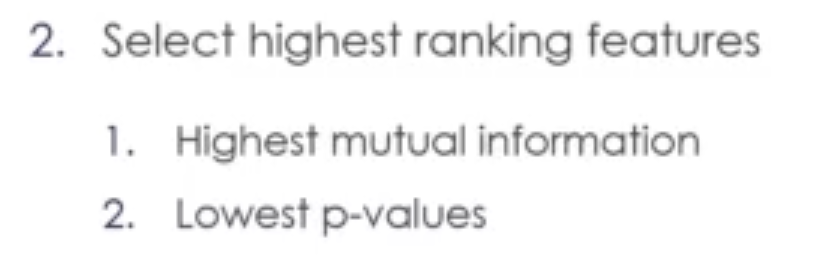

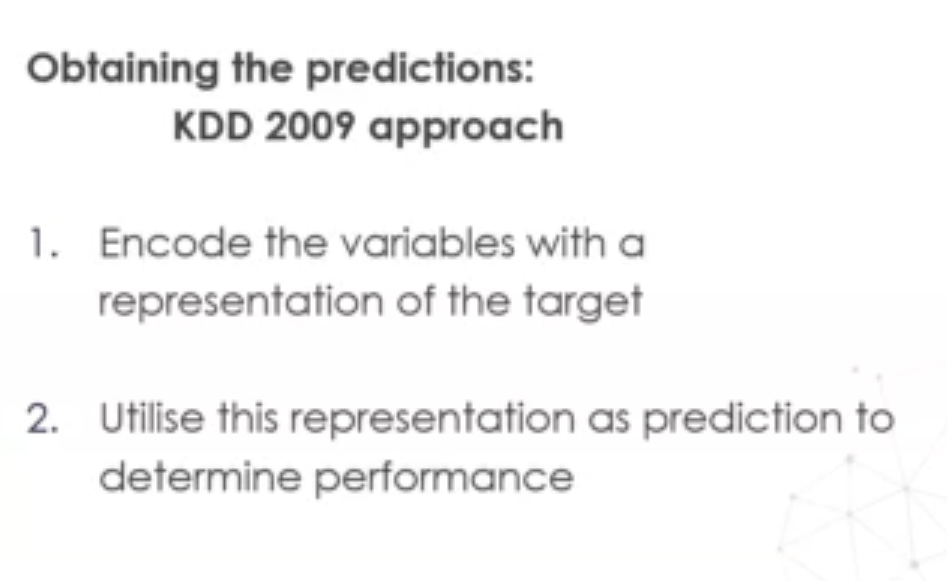

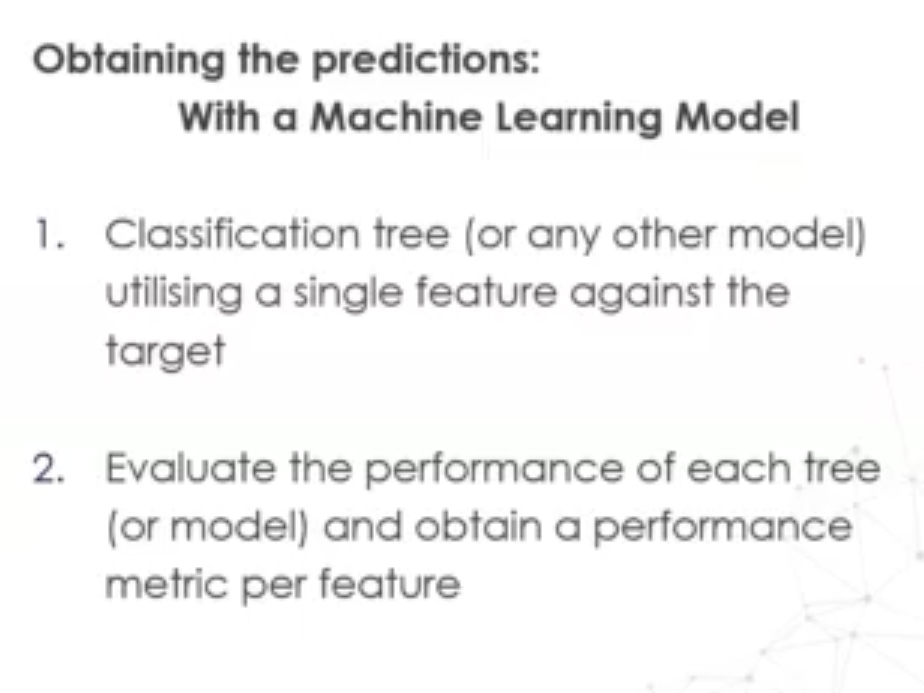

## Univariate roc-auc or mse (or any other metric really)

This procedure works as follows:

- First, it builds one decision tree per feature, to predict the target
- Second, it makes predictions using the decision tree and the mentioned feature
- Third, it measures the performance of that prediction, be it the roc-auc, the mse, or any other metric
- Fourth, it ranks the features according to the machine learning metric (roc-auc or mse)
- It selects the highest ranking features

Here, I will demonstrate how to select features based on univariate roc-auc or univariate mse.

In [58]:
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.metrics import roc_auc_score, mean_squared_error

## Classification

In [59]:
# load dataset

data = pd.read_csv(r'C:/Users/VigneshSS/Desktop/Feature Selection for Machine Learning/precleaned-datasets/dataset_2.csv', nrows=50000)
data.shape

(50000, 109)

**Important**

In all feature selection procedures, it is good practice to select the features by examining only the training set. And this is to avoid overfit.

In [60]:
# separate train and test sets
X_train, X_test, y_train, y_test = train_test_split(
    data.drop(labels=['target'], axis=1),
    data['target'],
    test_size=0.3,
    random_state=0)

X_train.shape, X_test.shape

((35000, 108), (15000, 108))

### Determine univariate roc-auc

In [61]:
# determine roc-auc for each feature

# here we store the roc-auc values
roc_values = []

# iterate over each feature in the dataset
for feature in X_train.columns:

    # train a decision tree classifier
    clf = DecisionTreeClassifier()
    clf.fit(X_train[feature].fillna(0).to_frame(), y_train)

    # obtain the predictions
    y_scored = clf.predict_proba(X_test[feature].to_frame())

    # calculate and store the roc-auc
    roc_values.append(roc_auc_score(y_test, y_scored[:, 1]))
    
# display the result
roc_values[0:10]

[0.5069248231292061,
 0.5006908738145861,
 0.4931445654646017,
 0.5039101753068067,
 0.5014351366034588,
 0.5028347252717772,
 0.5095234564543892,
 0.5062626193645395,
 0.4913455716601861,
 0.5066196352647712]

Text(0, 0.5, 'roc-auc')

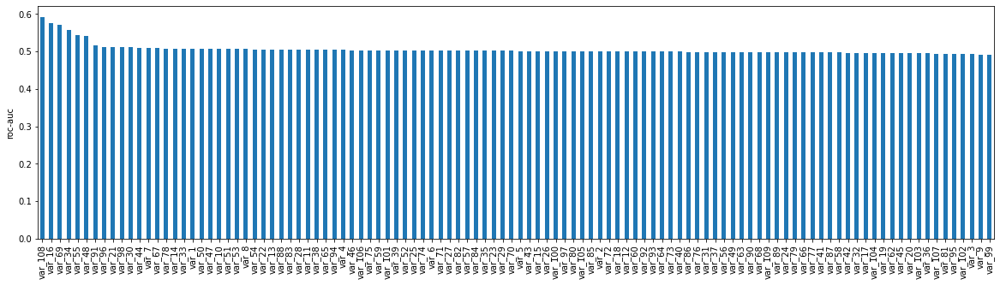

In [62]:
# now let's:

# 1) capture the roc-auc values in a pandas series
# 2) add the variable names in the index
# 3) sort the features based on the roc-auc
# 4) and make a var plot

roc_values = pd.Series(roc_values)
roc_values.index = X_train.columns
roc_values.sort_values(ascending=False).plot.bar(figsize=(20, 5))
plt.ylabel('roc-auc')

In [63]:
# a roc auc value of 0.5 indicates random decision
# let's check how many features show a roc-auc value
# higher than random

len(roc_values[roc_values > 0.5])

67

67 of 108  features show a predictive performance higher than 0.5.

You can of course tune the parameters of the Decision Tree to get better predictions and thus, more reliable metrics.

### Select features with roc-auc > 0.5

In [64]:
selected_features = roc_values[roc_values > 0.5].index

selected_features

Index(['var_1', 'var_2', 'var_4', 'var_5', 'var_6', 'var_7', 'var_8', 'var_10',
       'var_11', 'var_12', 'var_13', 'var_14', 'var_15', 'var_16', 'var_18',
       'var_21', 'var_22', 'var_23', 'var_25', 'var_26', 'var_27', 'var_28',
       'var_29', 'var_30', 'var_33', 'var_34', 'var_35', 'var_38', 'var_39',
       'var_43', 'var_44', 'var_46', 'var_47', 'var_48', 'var_50', 'var_51',
       'var_52', 'var_53', 'var_54', 'var_55', 'var_57', 'var_59', 'var_65',
       'var_67', 'var_69', 'var_70', 'var_71', 'var_72', 'var_74', 'var_75',
       'var_78', 'var_80', 'var_82', 'var_83', 'var_84', 'var_85', 'var_88',
       'var_91', 'var_94', 'var_96', 'var_97', 'var_98', 'var_100', 'var_101',
       'var_105', 'var_106', 'var_108'],
      dtype='object')

In [65]:
# select features in the dataframes

X_train = X_train[selected_features]
X_test = X_test[selected_features]

X_train.shape, X_test.shape

((35000, 67), (15000, 67))

## Regression

# Wrapper Methods

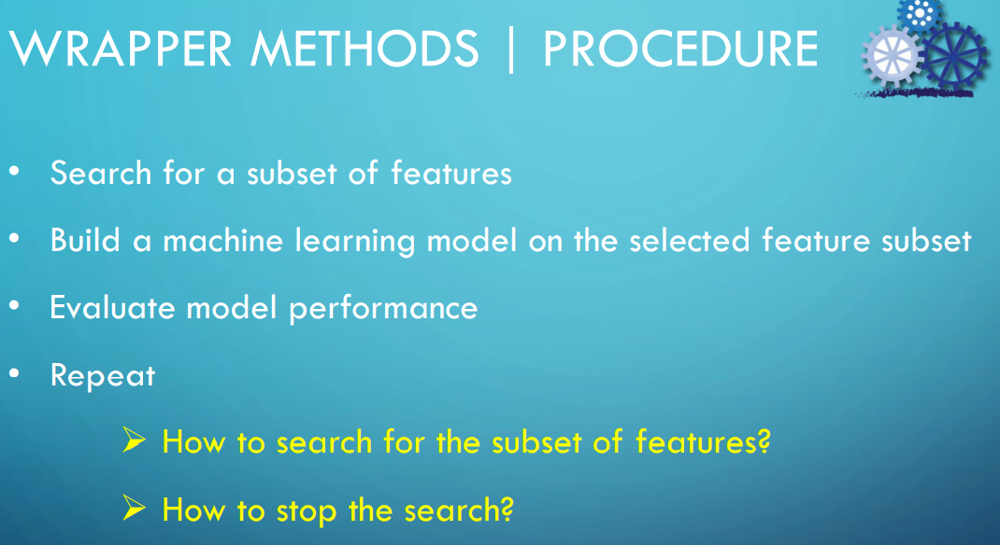

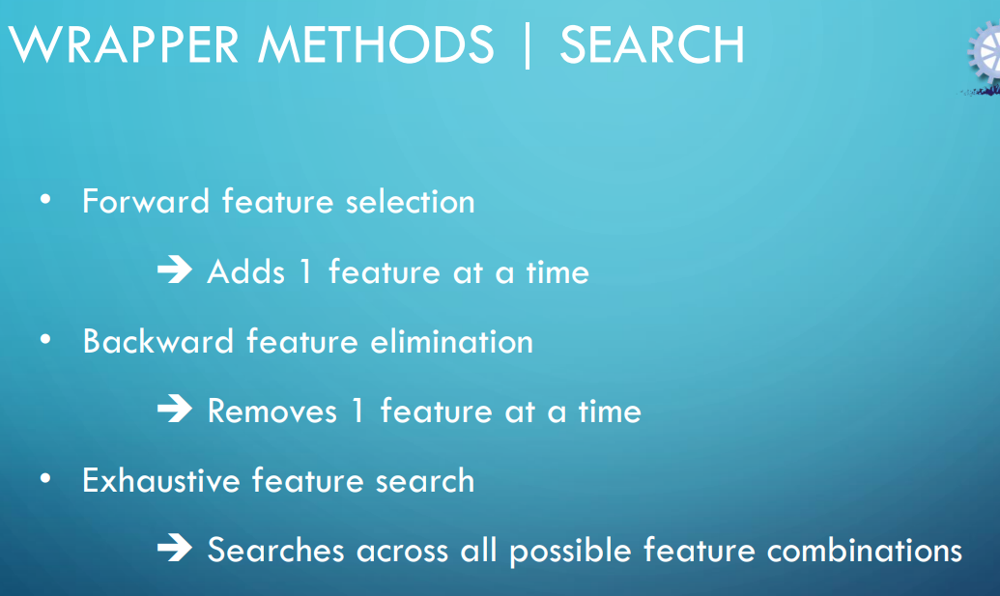

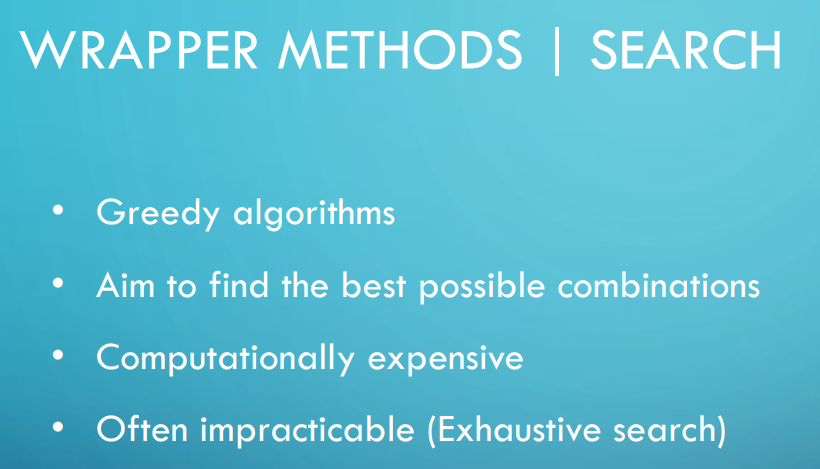

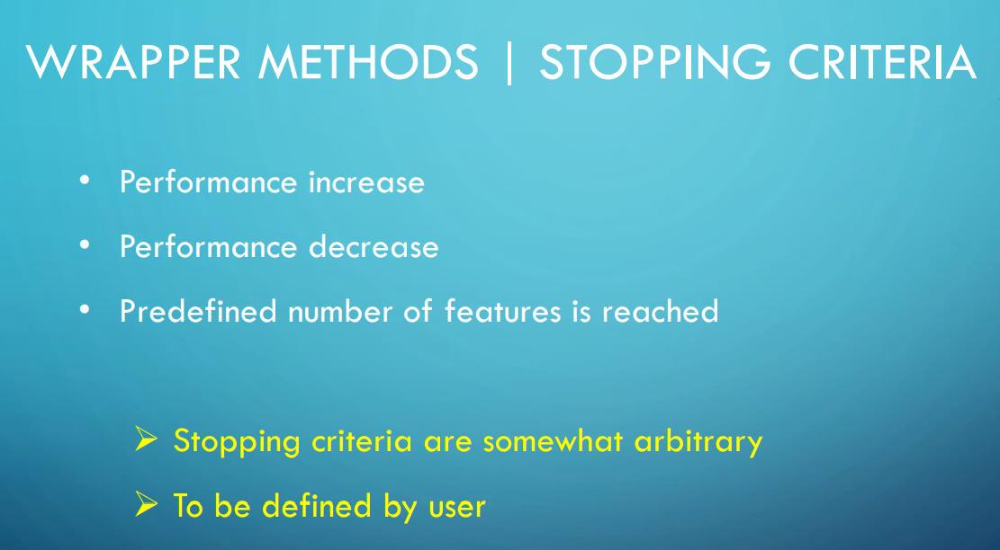

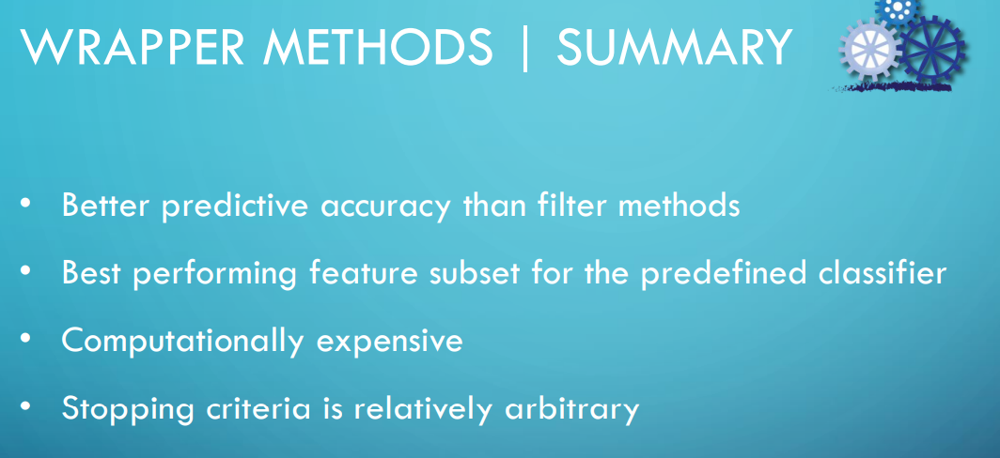

# EMBEDDED METHODS

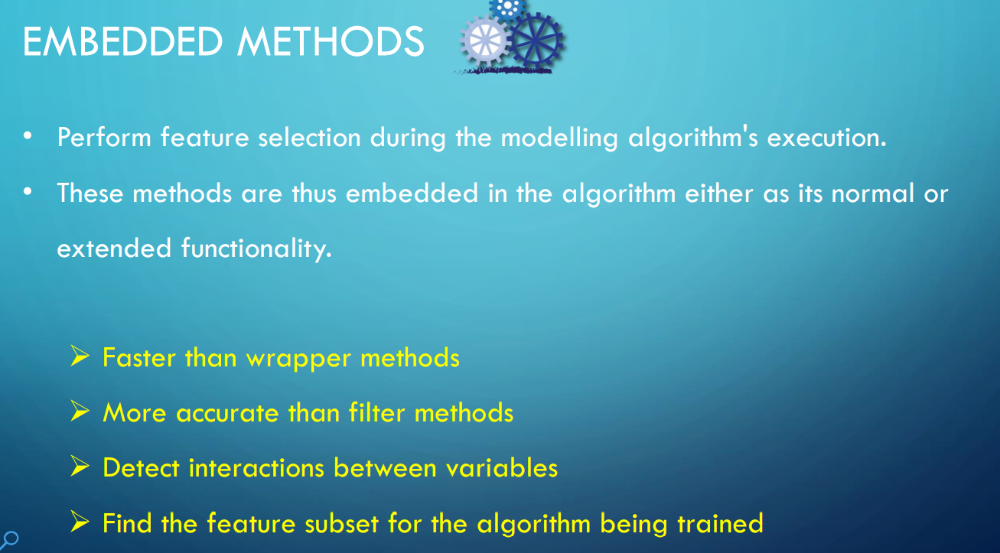

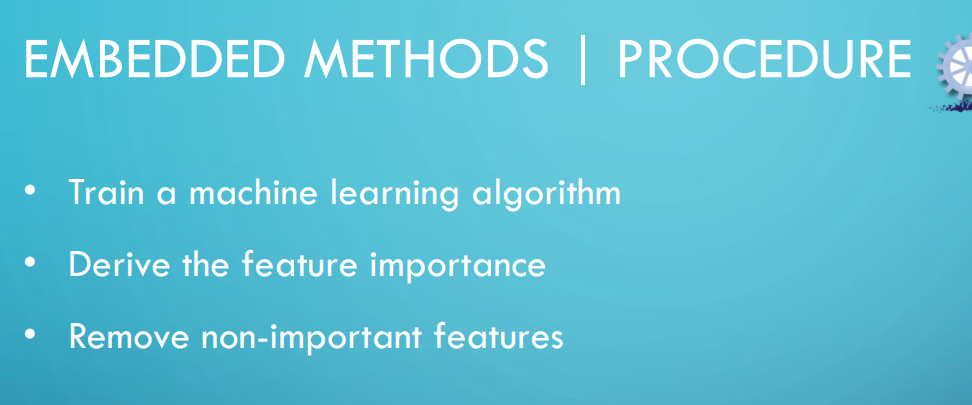

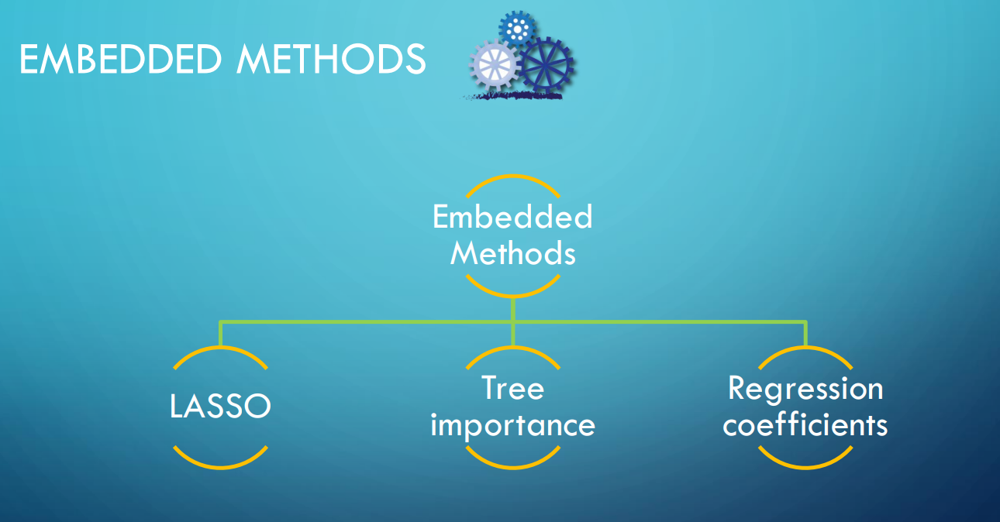

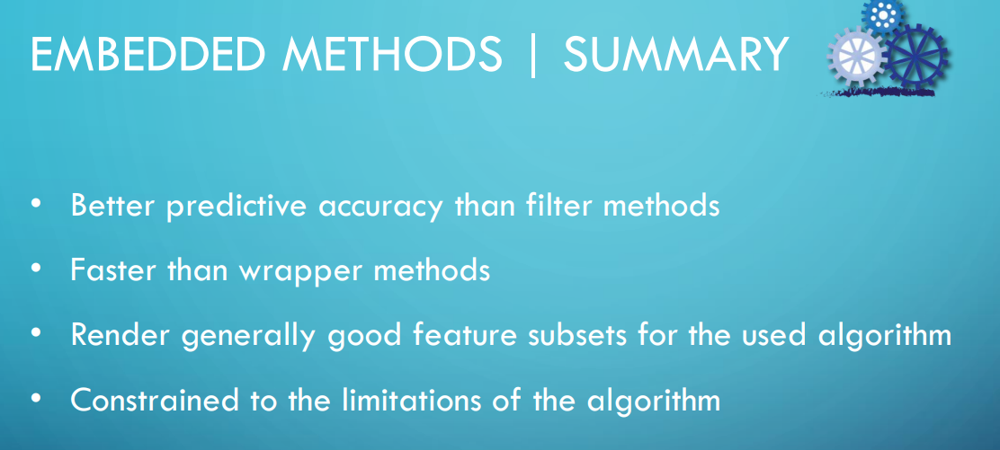